## [pyKNEEr](https://github.com/sbonaretti/pyKNEEr)

# [Preprocessing MR Knee Images](https://sbonaretti.github.io/pyKNEEr/preprocessing.html)

Preprocessing of MR images is fundamental to standardize spatial information and intensity of images

In the pipeline below:
- Steps 1-3 uniform image orientation, knee laterality, and image origin. The resulting image has the same intensity as the acquired `.dcm` image, but different collocation in space. It is saved as `_orig.mha`
- Steps 4-6 act on the intensities of the image, by correcting the inhomogeneous magnetic field, rescaling to a fixed range, and enhancing the cartilage contours [1]. The resulting image has different intensity than the acquired `.dcm` image, and it is used for atlas-based segmentation. It is saved as `_prep.mha`. These steps are computationally expensive, so if not needed, avoid them by setting `intensity_standardization` to zero (see below) 

---

*Notes for reproducibility of this notebook:*
- The original dicom images can be downloaded from the [OAI website](https://nda.nih.gov/oai). The ID of the used images are [here](https://github.com/sbonaretti/pyKNEEr/blob/master/publication/data/pyKNEEr_data_OAI.ipynb)  
- Location of input and output files in Zenodo and Github is [here](https://github.com/sbonaretti/pyKNEEr/blob/master/publication/data/data_index.ipynb)

- Download input image list file from [GitHub](https://github.com/sbonaretti/pyKNEEr/tree/master/publication/data):

In [ ]:
# download input file from GitHub
import wget
raw_url         = "https://raw.githubusercontent.com/sbonaretti/pyKNEEr/master/publication/data/"
input_file_name = "image_list_preprocessing_OAI2_FU.txt"
wget.download(raw_url + input_file_name, "./" + input_file_name)

---

## Import packages

In [1]:
%load_ext autoreload 
%autoreload 2

In [2]:
from pykneer import pykneer_io           as io
from pykneer import preprocessing_for_nb as prep

## Image information

Inputs:   
- `input_file_name` contains the list of the images to be preprocessed 
- `nOfCores` is the number of cores used for computations (computations are parallelized for speed)
- `intensity_standardization` is a flag that determines if the intensity standardization is performed (0=no, 1=yes)

In [3]:
input_file_name           = "./image_list_preprocessing_OAI2_FU.txt"
n_of_cores                = 10
intensity_standardization = 1

#### Read image data
- `imageData` is a dictionary (or struct), where each cell corresponds to an image. For each image, information such as paths and file names are stored  

In [4]:
image_data = io.load_image_data_preprocessing(input_file_name)

001_FU
002_FU
003_FU
004_FU
005_FU
006_FU
007_FU
008_FU
009_FU
010_FU
011_FU
012_FU
013_FU
014_FU
015_FU
016_FU
017_FU
018_FU
019_FU
020_FU
021_FU
022_FU
023_FU
024_FU
025_FU
026_FU
027_FU
028_FU
029_FU
030_FU
031_FU
032_FU
033_FU
034_FU
035_FU
036_FU
037_FU
038_FU
039_FU
040_FU
041_FU
042_FU
043_FU
044_FU
045_FU
046_FU
047_FU
048_FU
049_FU
050_FU
051_FU
052_FU
053_FU
054_FU
055_FU
056_FU
057_FU
058_FU
059_FU
060_FU
061_FU
062_FU
063_FU
064_FU
065_FU
066_FU
067_FU
068_FU
069_FU
070_FU
071_FU
072_FU
073_FU
074_FU
075_FU
076_FU
077_FU
078_FU
079_FU
080_FU
081_FU
082_FU
083_FU
084_FU
085_FU
086_FU
087_FU
088_FU
-> information loaded for 88 subjects


## Spatial standardization

#### Step 0: Read the dicom images

In [5]:
prep.read_dicom_stack(image_data, n_of_cores)

-> 016_FU
Size:      384   384   160
Spacing:   0.36 0.36 0.70
Origin:    -15.75 -71.44 67.58
Direction: 
0.02 0.00 -1.00 
1.00 0.00 0.02 
0.00 -1.00 0.00
-> 019_FU
Size:      384   384   160
Spacing:   0.36 0.36 0.70
Origin:    166.73 -75.06 55.06
Direction: 
-0.33 0.00 -0.95 
0.95 -0.00 -0.33 
-0.00 -1.00 0.00
-> 004_FU
Size:      384   384   160
Spacing:   0.36 0.36 0.70
Origin:    134.61 -62.46 62.25
Direction: 
-0.09 0.00 -1.00 
1.00 0.00 -0.09 
0.00 -1.00 -0.00
-> 001_FU
Size:      384   384   160
Spacing:   0.36 0.36 0.70
Origin:    128.77 -66.43 40.83
Direction: 
-0.05 0.00 -1.00 
1.00 0.00 -0.05 
0.00 -1.00 -0.00
-> 025_FU
Size:      384   384   160
-> 007_FU
Spacing:   0.36 0.36 0.70
Size:      384   384   160
Origin:    95.57 -90.79 70.00
Spacing:   0.36 0.36 0.70
Direction: 
0.12 0.00 -0.99 
0.99 0.00 0.12 
0.00 -1.00 0.00Origin:    113.65 -85.55 72.41

Direction: 
0.16 0.00 -0.99 
0.99 -0.00 0.16 
-0.00 -1.00 -0.00
-> 013_FU
Size:      384   384   160
Spacing:   0.36 0.36 

#####   Save image header
The image header of the first slice of the dicom stack is saved in a `.txt` file. This can be useful to extract information such as subject's date of birth, exam date, etc.

In [6]:
prep.print_dicom_header(image_data, n_of_cores)

-> Dicom headers written
-> The total time was 2.74 seconds (about 0 min)


#### Step 1: Change orientation to RAI 
All images are oriented to the RAI (right, anterior, inferior) orientation

In [7]:
prep.orientation_to_rai(image_data, n_of_cores)

-> Image orientation changed
-> The total time was 20.69 seconds (about 0 min)


#### Step 2: Change laterality if knee is right
Right knees are flipped to left knees to have the same laterality 

In [8]:
prep.flip_rl(image_data, n_of_cores)

-> Image laterality changed for right images
-> The total time was 2.74 seconds (about 0 min)


#### 3. Set image origin to (0,0,0)
All images are set to the origin (0,0,0). Images are saved as *_orig.mha and they are anonymized

In [9]:
prep.origin_to_zero(image_data, n_of_cores)

-> Image origin changed
-> _orig.mha images saved
-> The total time was 5.47 seconds (about 0 min)


#### 4. Correct magnetic field inhomogeneities
Magnetic fields inhomogeneities create grey shades on images. This correction removes these shades. This is the longest step of the processing. It can take up to 15-20 min on a standard PC or laptop

In [10]:
if intensity_standardization == 1:
    prep.field_correction(image_data, n_of_cores) # add "#" in front of the command if intensity standardization is not needed

-> The total time for image 019_FU was 912 seconds (about 15 min)
-> The total time for image 007_FU was 946 seconds (about 15 min)
-> The total time for image 025_FU was 1043 seconds (about 17 min)
-> The total time for image 028_FU was 1065 seconds (about 17 min)
-> The total time for image 022_FU was 1093 seconds (about 18 min)
-> The total time for image 016_FU was 1209 seconds (about 20 min)
-> The total time for image 013_FU was 1267 seconds (about 21 min)
-> The total time for image 010_FU was 1269 seconds (about 21 min)
-> The total time for image 004_FU was 1316 seconds (about 21 min)
-> The total time for image 001_FU was 1689 seconds (about 28 min)
-> The total time for image 026_FU was 959 seconds (about 15 min)
-> The total time for image 008_FU was 1122 seconds (about 18 min)
-> The total time for image 020_FU was 1306 seconds (about 21 min)
-> The total time for image 023_FU was 1170 seconds (about 19 min)
-> The total time for image 005_FU was 982 seconds (about 16 min)

#### 5. Rescale intensities to [0 100]
Intensies are rescaled to the fixed range [0,100] to obtain homogeneous intensity range across images

In [11]:
if intensity_standardization == 1:
    prep.rescale_to_range(image_data, n_of_cores) # add "#" in front of the command if intensity standardization is not needed

-> Image intensities rescaled
-> The total time was 15.30 seconds (about 0 min)


#### 6. Edge preserving smoothing
Cartilage contours are enhanced using a curvature anisotropic diffusion filter

In [12]:
if intensity_standardization == 1:
    prep.edge_preserving_smoothing(image_data, n_of_cores) # add "#" in front of the command if intensity standardization is not needed

-> Image smoothed
-> _prep.mha images saved
-> The total time was 589.17 seconds (about 9 min)


## Visualize original and preprocessed image
Each row corresponds to one image. Left: Original image after spatial preprocessing (steps 1-3). Right: Preprocessed image after intensities correction (steps 4-6). 
Note: A total black rendering of an original image is caused by very large intensity distribution

<Figure size 576x25344 with 0 Axes>

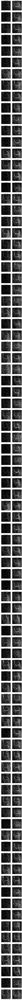

In [13]:
prep.show_preprocessed_images(image_data, intensity_standardization)

### References

[1] Shan L., Zach C., Charles C., Niethammer M. [*Automatic Atlas-Based Three-Label Cartilage Segmentation from MR Knee Images.*](https://www.ncbi.nlm.nih.gov/pubmed/25128683) Med Image Anal. Oct;18(7):1233-46. 2014.

### Dependencies

In [14]:
%load_ext watermark
%watermark -v -m -p SimpleITK,ikt,numpy,matplotlib,multiprocessing

CPython 3.6.1
IPython 6.4.0

SimpleITK unknown
ikt not installed
numpy 1.14.5
matplotlib 2.2.2
multiprocessing unknown

compiler   : GCC 4.8.5 20150623 (Red Hat 4.8.5-11)
system     : Linux
release    : 3.10.0-862.14.4.el7.x86_64
machine    : x86_64
processor  : x86_64
CPU cores  : 20
interpreter: 64bit
